In [1]:
import warnings
warnings.filterwarnings("ignore", message=".*The 'nopython' keyword.*")

In [2]:
from transformers import AutoTokenizer, AutoModelForCausalLM
import shap

In [3]:
tokenizer = AutoTokenizer.from_pretrained("gpt2", use_fast=True)
model = AutoModelForCausalLM.from_pretrained("gpt2")

In [4]:
model.config.is_decoder=True
# set text-generation params under task_specific_params
model.config.task_specific_params["text-generation"] = {
    "do_sample": True,
    "max_length": 50,
    "temperature": 0.7,
    "top_k": 50,
    "no_repeat_ngram_size": 2
}

In [5]:
s = ['I enjoy walking with my cute dog']
input_ids = tokenizer.encode(s[0], return_tensors='pt')
output = model.generate(input_ids, max_length=50)
output_sentence = tokenizer.decode(output[0], skip_special_tokens=True)
print(output_sentence)

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


I enjoy walking with my cute dog, but I'm not sure if I'll ever be able to walk with my dog. I'm not sure if I'll ever be able to walk with my dog.

I'm not sure if I'll


In [6]:
explainer = shap.Explainer(model, tokenizer)
shap_values = explainer(s)
shap.plots.text(shap_values)

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.


**Teachering Forcing Examples:**

In [7]:
x = [
    "Allianz is an insurance company.",
    "Allianz is an investment company.",
    "Allianz is a manufacturing company.",
    "Allianz is a car company.",
    "Allianz is a financial company.",
    "Allianz is a sport company.",
    "Allianz is an interesting company.",
    "Allianz is a fashion company."
]

y = [
    "It offers a range of insurance and asset management products and services to individuals and businesses worldwide.",
    "It offers a range of insurance and asset management products and services to individuals and businesses worldwide.",
    "It offers a range of insurance and asset management products and services to individuals and businesses worldwide.",
    "It offers a range of insurance and asset management products and services to individuals and businesses worldwide.",
    "It offers a range of insurance and asset management products and services to individuals and businesses worldwide.",
    "It offers a range of insurance and asset management products and services to individuals and businesses worldwide.",
    "It offers a range of insurance and asset management products and services to individuals and businesses worldwide.",
    "It offers a range of insurance and asset management products and services to individuals and businesses worldwide."
]

In [8]:
teacher_forcing_model = shap.models.TeacherForcing(model, tokenizer)
masker = shap.maskers.Text(tokenizer, mask_token = "...", collapse_mask_token=True)

In [14]:
explainer = shap.Explainer(teacher_forcing_model, masker)
shap_values = explainer(x, y)

Partition explainer: 9it [00:11,  5.79s/it]               


In [15]:
shap.plots.text(shap_values)

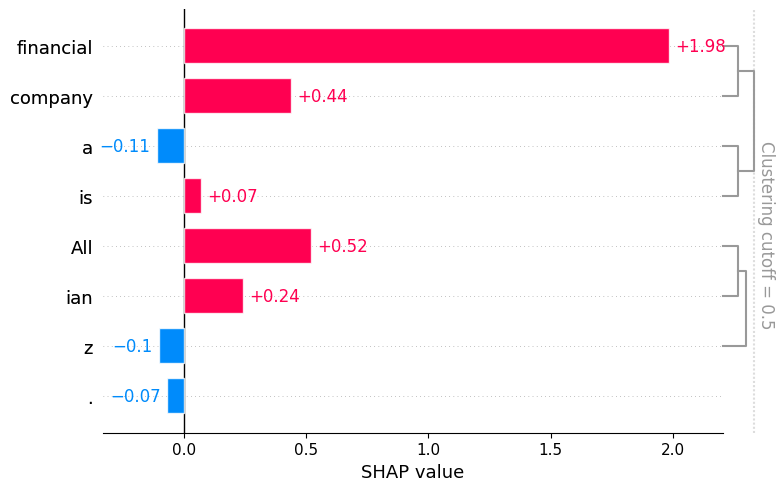

In [16]:
shap.plots.bar(shap_values[4, :, "insurance"])

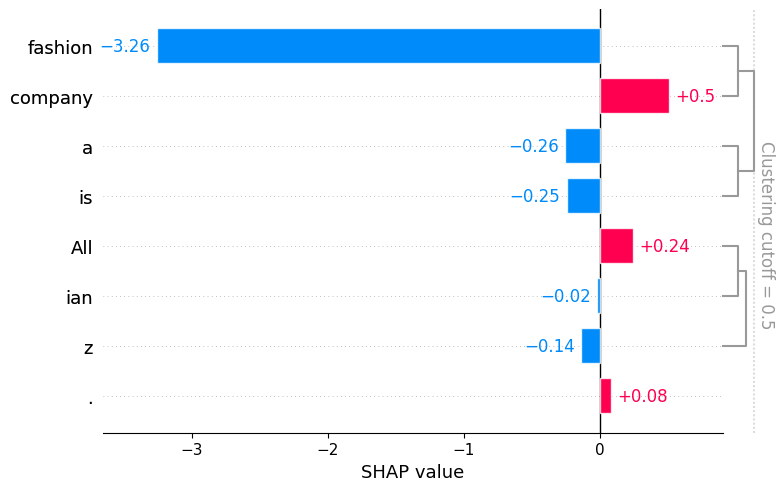

In [17]:
shap.plots.bar(shap_values[7, :, "insurance"])